In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="whitegrid")
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")

In [2]:
df=pd.read_csv("temp.csv")
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [3]:
# check shape of the Data
df.shape

(7752, 25)

There are 7,752 rows and 25 columns

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


There are 23 Independent Variables

and there are 2 Target variables

1. Next_Tmax
2. Next_Tmin

both are numeric value so, it is a regression problem

In [5]:
# check columns
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [6]:
#check missing value
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [7]:
# There are lots of null values are present
# we should drop null values
df=df.dropna(axis=0)

In [8]:
df.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

In [9]:
df.shape

(7588, 25)

now we have total 7588 rows and 25 columns

In [10]:
df['station'].unique()

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.])

In [11]:
for i in df.columns:
    print('******',i,'*******')
    print(df[i].nunique())

****** station *******
25
****** Date *******
307
****** Present_Tmax *******
167
****** Present_Tmin *******
155
****** LDAPS_RHmin *******
7585
****** LDAPS_RHmax *******
7577
****** LDAPS_Tmax_lapse *******
7588
****** LDAPS_Tmin_lapse *******
7588
****** LDAPS_WS *******
7588
****** LDAPS_LH *******
7588
****** LDAPS_CC1 *******
7485
****** LDAPS_CC2 *******
7496
****** LDAPS_CC3 *******
7512
****** LDAPS_CC4 *******
7438
****** LDAPS_PPT1 *******
2779
****** LDAPS_PPT2 *******
2479
****** LDAPS_PPT3 *******
2326
****** LDAPS_PPT4 *******
1892
****** lat *******
12
****** lon *******
25
****** DEM *******
25
****** Slope *******
25
****** Solar radiation *******
1575
****** Next_Tmax *******
181
****** Next_Tmin *******
157


In [12]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,...,7588.000000,7588.000000,7588.000000,7588.000000,7588.00000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000
mean,13.014101,29.748366,23.195809,56.724969,88.360823,29.620128,23.511786,7.094097,62.492606,0.368510,...,0.480738,0.275007,0.265373,37.544792,126.99142,61.918136,1.259755,5343.724208,30.241526,22.910820
std,7.217858,2.967401,2.400880,14.626559,7.199456,2.943496,2.342579,2.177034,33.686158,0.262260,...,1.743327,1.146087,1.179661,0.050428,0.07922,54.323529,1.372748,429.782561,3.111807,2.482256
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,37.456200,126.82600,12.370000,0.098500,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.600000,45.960243,84.203724,27.673756,22.086820,5.675358,37.206201,0.146546,...,0.000000,0.000000,0.000000,37.510200,126.93700,28.700000,0.271300,5001.485717,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.023199,89.784122,29.709537,23.758249,6.547838,56.898324,0.315706,...,0.000000,0.000000,0.000000,37.550700,126.99500,45.716000,0.618000,5441.987305,30.400000,23.100000
75%,19.000000,32.000000,24.800000,67.115099,93.742725,31.711109,25.155660,8.028960,84.235666,0.574174,...,0.017735,0.007855,0.000017,37.577600,127.04200,59.832400,1.767800,5729.485840,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.13500,212.335000,5.178200,5992.895996,38.900000,29.800000


<AxesSubplot:>

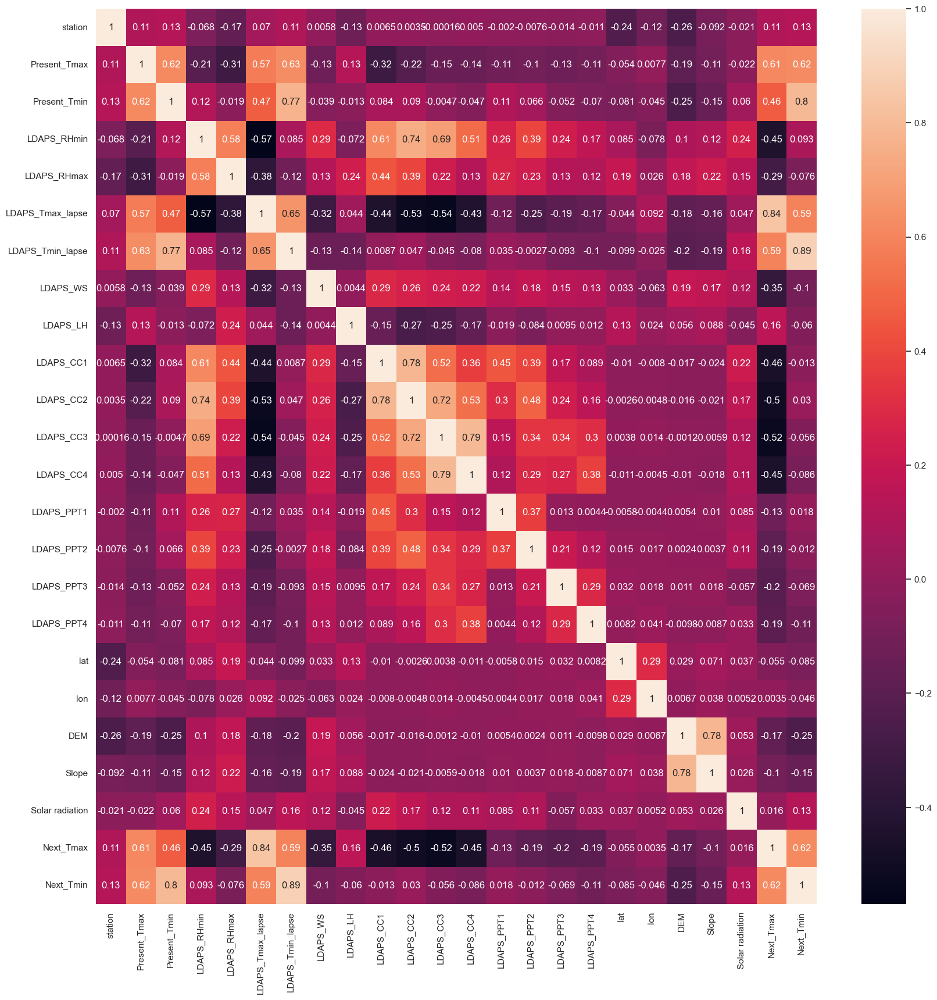

In [13]:
# check correlation
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(),annot=True)

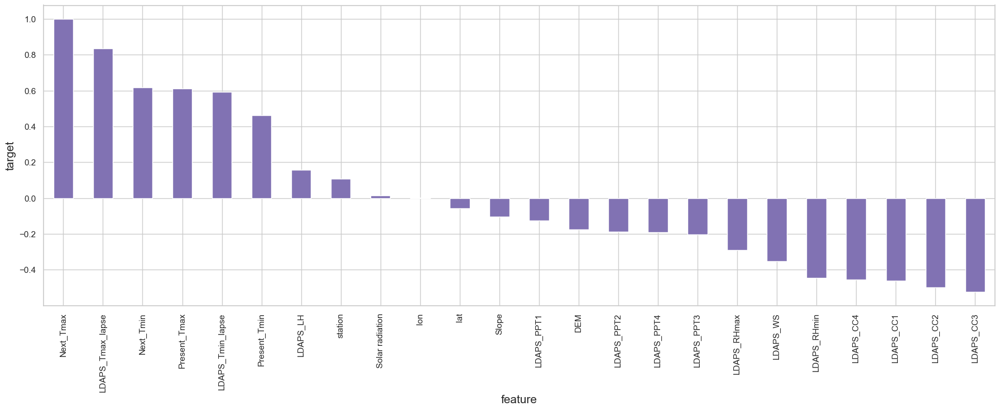

In [14]:
plt.figure(figsize=(22,7))
df.corr()["Next_Tmax"].sort_values(ascending=False).plot(kind='bar',color='m')
plt.xlabel("feature",fontsize=15)
plt.ylabel("target",fontsize=15)
plt.show()

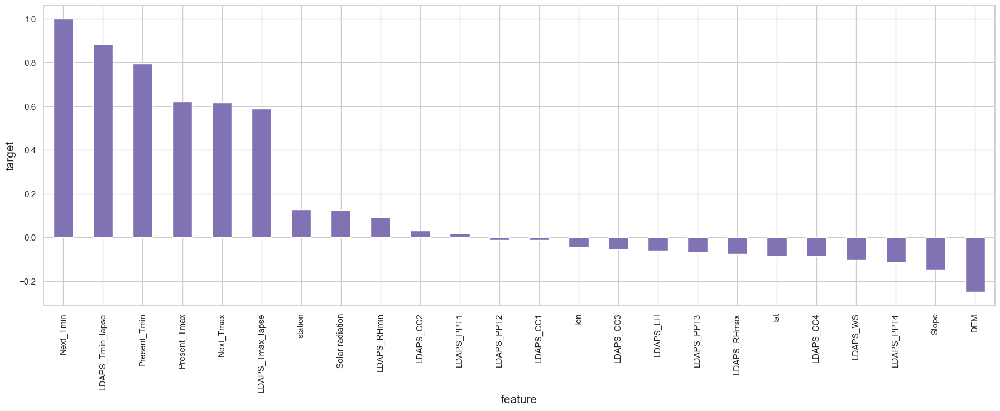

In [15]:
plt.figure(figsize=(22,7))
df.corr()["Next_Tmin"].sort_values(ascending=False).plot(kind='bar',color='m')
plt.xlabel("feature",fontsize=15)
plt.ylabel("target",fontsize=15)
plt.show()

# visualisation

In [16]:
import plotly.express as px
fig = px.line(df,x = 'Present_Tmax', y = ['Next_Tmin','Next_Tmax'], template = 'plotly_dark', title = 'Maximum Air Temprature')
fig.show()

<AxesSubplot:xlabel='Next_Tmin', ylabel='Next_Tmax'>

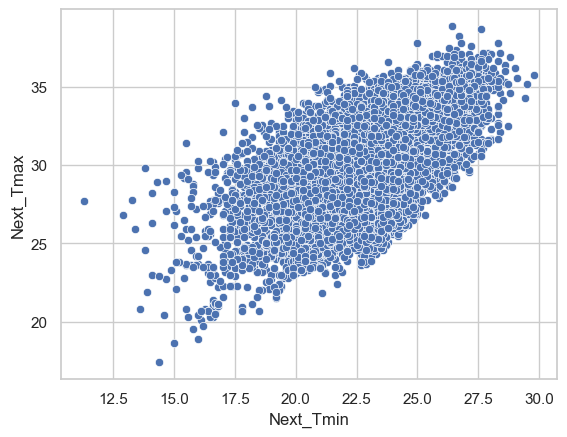

In [17]:
# relation between next day min and max tempreatue
sns.scatterplot(df['Next_Tmin'],df['Next_Tmax'])

1. Next_Tmin--->The next-day maximum air temperature (Â°C): 17.4 to 38.9
2. Next_Tmin--->The next-day minimum air temperature (Â°C): 11.3 to 29.8T
    
both the Variables have positive relation, they directly proportional to each other    

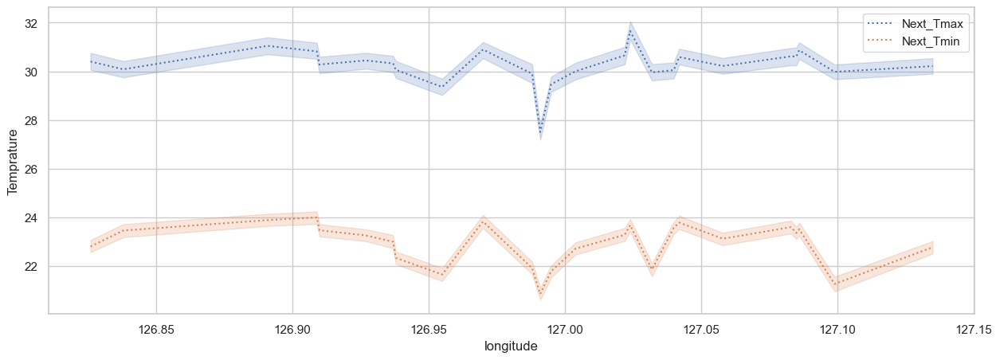

In [18]:
#Relation between Next_Tmax and longitude
plt.figure(figsize=(15,5))
#plt.figure(figsize=(15,5))
x=df['lon']
y1=df['Next_Tmax']
y2=df['Next_Tmin']
plt.xlabel("longitude")
plt.ylabel("Temprature")
sns.lineplot(x, y1,linestyle='dotted',label ='Next_Tmax')
sns.lineplot(x, y2, linestyle='dotted',label ='Next_Tmin')
plt.legend()
  

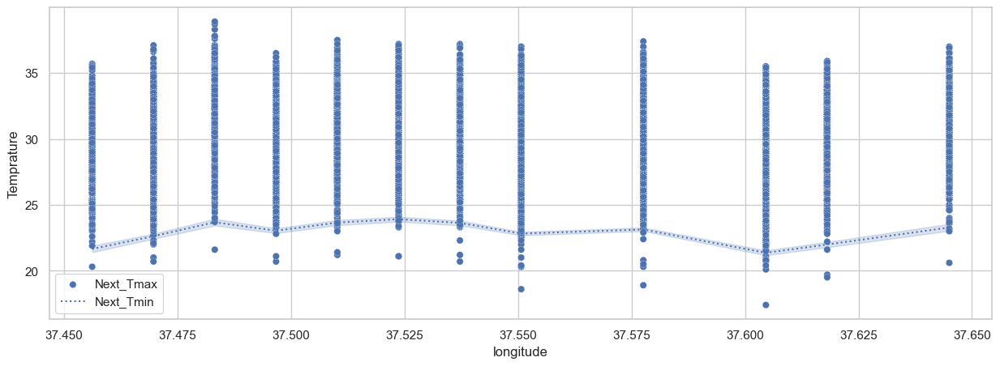

In [19]:
#relation between lattitude and Next Day Air Temperature
plt.figure(figsize=(15,5))
#plt.figure(figsize=(15,5))
x=df['lat']
y1=df['Next_Tmax']
y2=df['Next_Tmin']
plt.xlabel("longitude")
plt.ylabel("Temprature")
sns.scatterplot(x, y1,linestyle='dotted',label ='Next_Tmax')
sns.lineplot(x, y2, linestyle='dotted',label ='Next_Tmin')
plt.legend()
  

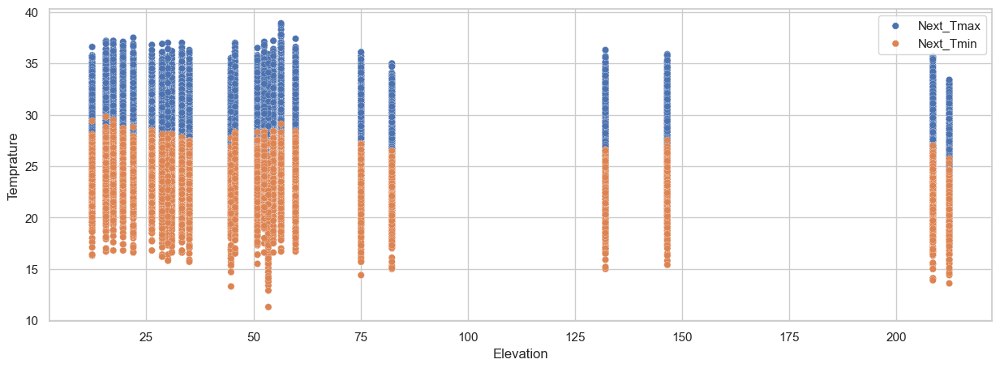

In [20]:
#relation between Elevation and Next Day Air Temperature
plt.figure(figsize=(15,5))
#plt.figure(figsize=(15,5))
x=df['DEM']
y1=df['Next_Tmax']
y2=df['Next_Tmin']
plt.xlabel("Elevation")
plt.ylabel("Temprature")
sns.scatterplot(x, y1,linestyle='dotted',label ='Next_Tmax')
sns.scatterplot(x, y2, linestyle='dotted',label ='Next_Tmin')
plt.legend()
  

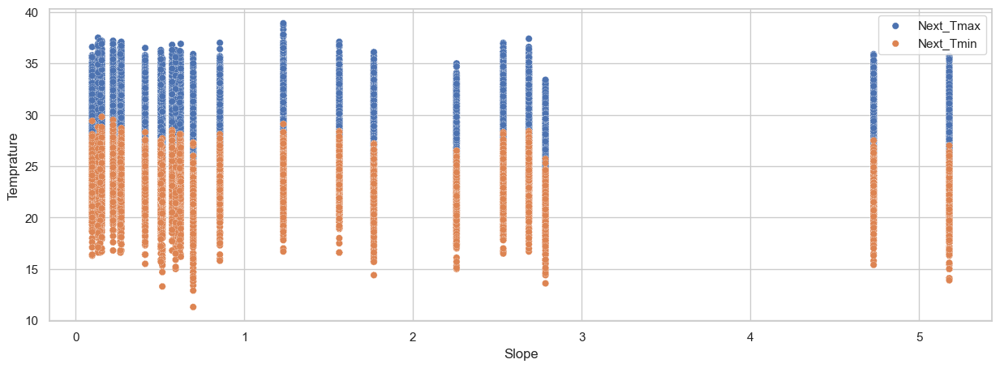

In [21]:
#relation between Elevation and Next Day Air Temperature
plt.figure(figsize=(15,5))
#plt.figure(figsize=(15,5))
x=df['Slope']
y1=df['Next_Tmax']
y2=df['Next_Tmin']
plt.xlabel("Slope")
plt.ylabel("Temprature")
sns.scatterplot(x, y1,linestyle='dotted',label ='Next_Tmax')
sns.scatterplot(x, y2, linestyle='dotted',label ='Next_Tmin')
plt.legend()
  

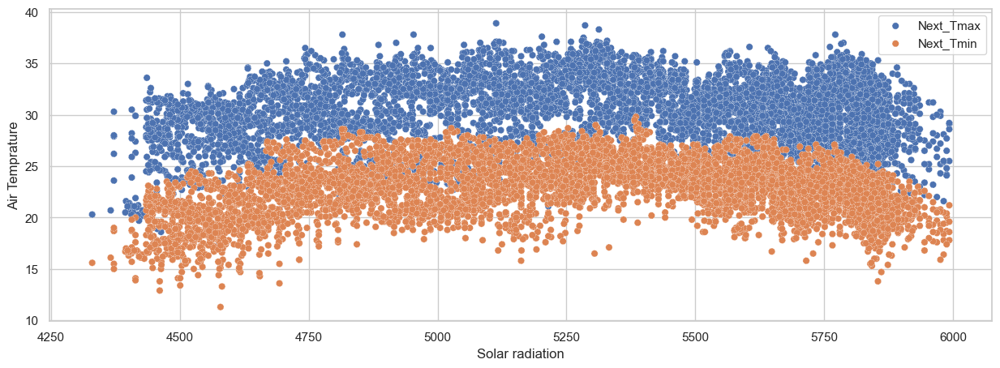

In [22]:
#relation between solar radiation and Next Day Air Temperature
plt.figure(figsize=(15,5))
#plt.figure(figsize=(15,5))
x=df['Solar radiation']
y1=df['Next_Tmax']
y2=df['Next_Tmin']
plt.xlabel("Solar radiation")
plt.ylabel("Air Temprature")
sns.scatterplot(x, y1,linestyle='dotted',label ='Next_Tmax')
sns.scatterplot(x, y2,linestyle='dotted',label ='Next_Tmin')
plt.legend()
  

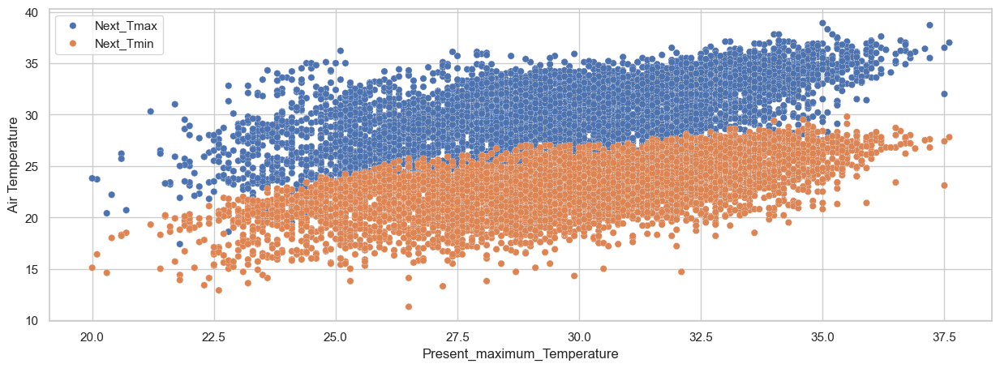

In [23]:
#relation between solar radiation and Next Day Air Temperature
plt.figure(figsize=(15,5))
#plt.figure(figsize=(15,5))
x=df['Present_Tmax']
y1=df['Next_Tmax']
y2=df['Next_Tmin']
plt.xlabel("Present_maximum_Temperature")
plt.ylabel(" Air Temperature")
sns.scatterplot(x, y1,linestyle='dotted',label ='Next_Tmax')
sns.scatterplot(x, y2,linestyle='dotted',label ='Next_Tmin')
plt.legend()
  

In [24]:
# Relation between Present_Tmin ana Next Day Air Temperature
fig=px.scatter(df,x='Present_Tmin',y=['Next_Tmax','Next_Tmin'],title='Next Day Air Temperature')
fig.show()



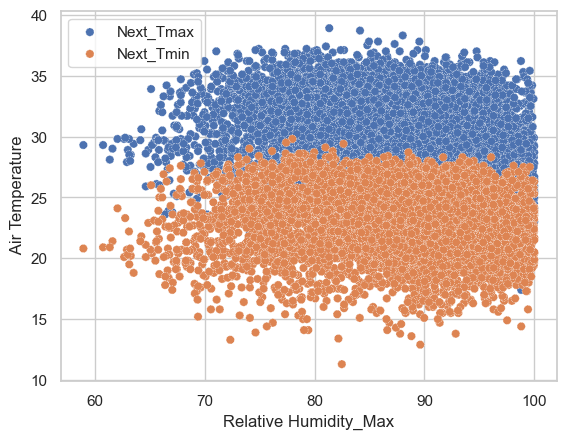

In [25]:
# Relation between Air Temperature and max Relative Humidity
x=df['LDAPS_RHmax']
y1=df['Next_Tmax']
y2=df['Next_Tmin']
plt.xlabel("Relative Humidity_Max")
plt.ylabel(" Air Temperature")
sns.scatterplot(x, y1,linestyle='dotted',label ='Next_Tmax')
sns.scatterplot(x, y2,linestyle='dotted',label ='Next_Tmin')
plt.legend()
  

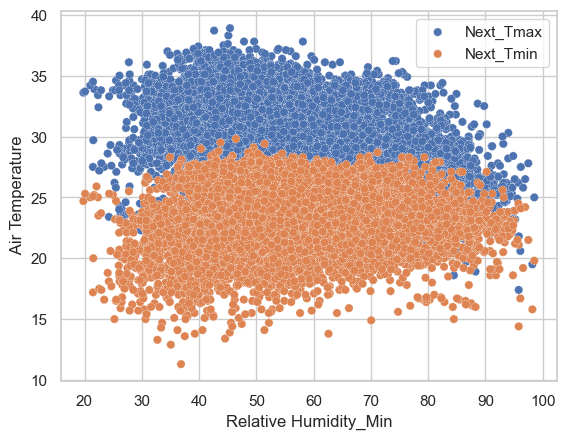

In [26]:
# Relation between Air Temperature and  min Relative Humidity
x=df['LDAPS_RHmin']
y1=df['Next_Tmax']
y2=df['Next_Tmin']
plt.xlabel("Relative Humidity_Min")
plt.ylabel(" Air Temperature")
sns.scatterplot(x, y1,linestyle='dotted',label ='Next_Tmax')
sns.scatterplot(x, y2,linestyle='dotted',label ='Next_Tmin')
plt.legend()
  

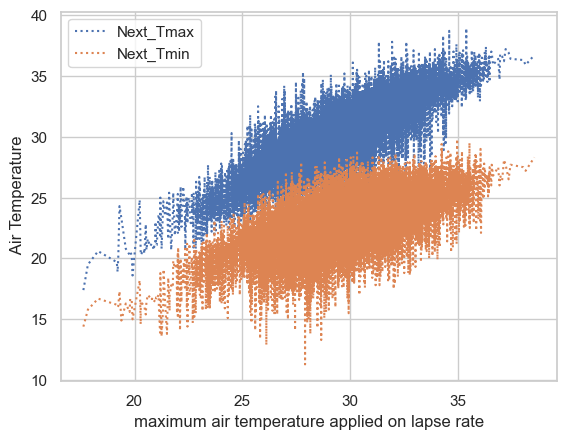

In [27]:
# Relation between Air Temperature and  next_day maximum air temperature applied lapse rate
x=df['LDAPS_Tmax_lapse']
y1=df['Next_Tmax']
y2=df['Next_Tmin']
plt.xlabel("maximum air temperature applied on lapse rate")
plt.ylabel(" Air Temperature")
sns.lineplot(x, y1,linestyle='dotted',label ='Next_Tmax')
sns.lineplot(x, y2,linestyle='dotted',label ='Next_Tmin')
plt.legend()
  

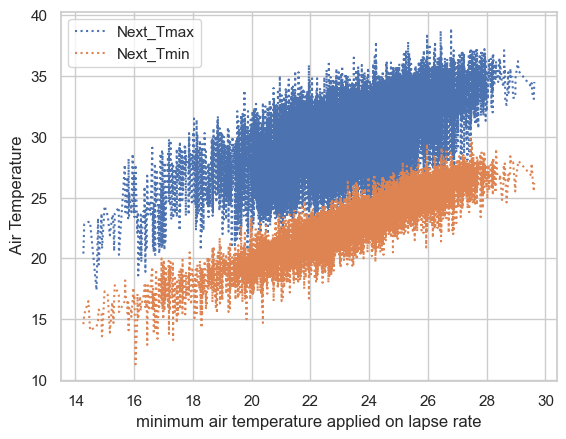

In [28]:
# Relation between Air Temperature and  next_day minimum air temperature applied lapse rate
x=df['LDAPS_Tmin_lapse']
y1=df['Next_Tmax']
y2=df['Next_Tmin']
plt.xlabel("minimum air temperature applied on lapse rate")
plt.ylabel(" Air Temperature")
sns.lineplot(x, y1,linestyle='dotted',label ='Next_Tmax')
sns.lineplot(x, y2,linestyle='dotted',label ='Next_Tmin')
plt.legend()
  

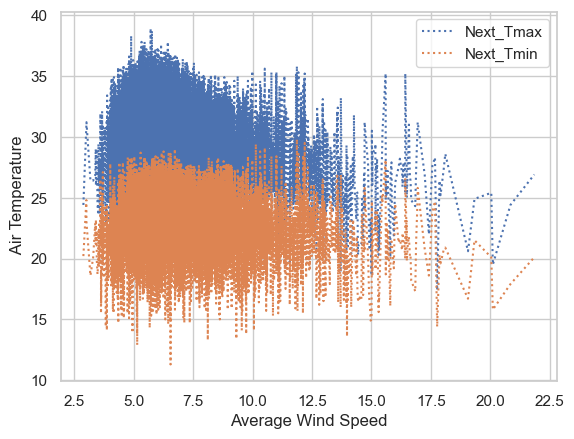

In [29]:
# Relation between Air Temperature and  Average Wind Speed
x=df['LDAPS_WS']
y1=df['Next_Tmax']
y2=df['Next_Tmin']
plt.xlabel("Average Wind Speed")
plt.ylabel(" Air Temperature")
sns.lineplot(x, y1,linestyle='dotted',label ='Next_Tmax')
sns.lineplot(x, y2,linestyle='dotted',label ='Next_Tmin')
plt.legend()
  

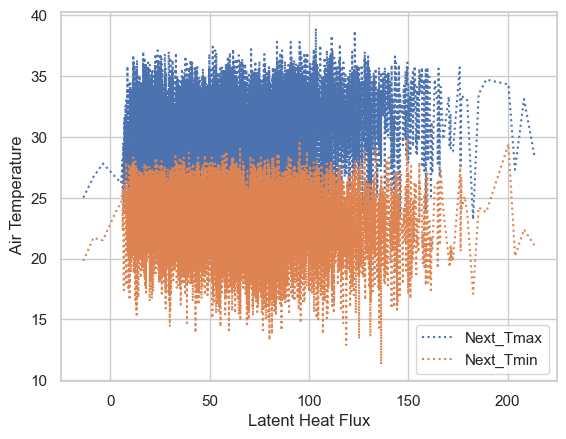

In [30]:
# Relation between Air Temperature and  Latent Heat Flux
x=df['LDAPS_LH']
y1=df['Next_Tmax']
y2=df['Next_Tmin']
plt.xlabel("Latent Heat Flux")
plt.ylabel(" Air Temperature")
sns.lineplot(x, y1,linestyle='dotted',label ='Next_Tmax')
sns.lineplot(x, y2,linestyle='dotted',label ='Next_Tmin')
plt.legend()
  

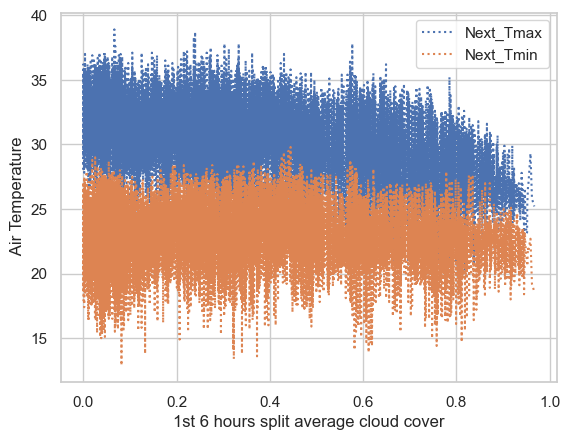

In [31]:
# Relation between Air Temperature and  1st 6hours split average cloud cover
x=df['LDAPS_CC1']
y1=df['Next_Tmax']
y2=df['Next_Tmin']
plt.xlabel("1st 6 hours split average cloud cover")
plt.ylabel(" Air Temperature")
sns.lineplot(x, y1,linestyle='dotted',label ='Next_Tmax')
sns.lineplot(x, y2,linestyle='dotted',label ='Next_Tmin')
plt.legend()
  

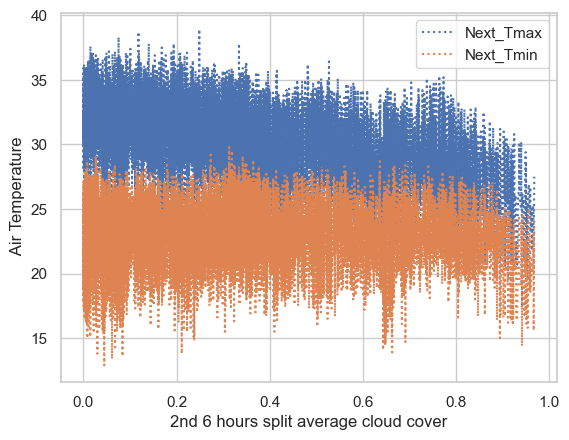

In [32]:
# Relation between Air Temperature and  2nd 6hours split average cloud cover
x=df['LDAPS_CC2']
y1=df['Next_Tmax']
y2=df['Next_Tmin']
plt.xlabel("2nd 6 hours split average cloud cover")
plt.ylabel(" Air Temperature")
sns.lineplot(x, y1,linestyle='dotted',label ='Next_Tmax')
sns.lineplot(x, y2,linestyle='dotted',label ='Next_Tmin')
plt.legend()

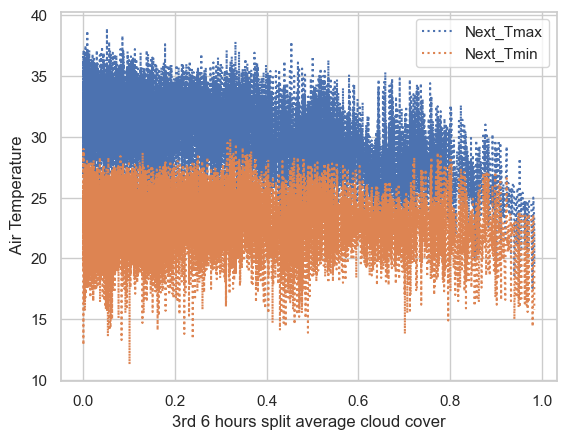

In [33]:
# Relation between Air Temperature and  3rd 6hours split average cloud cover
x=df['LDAPS_CC3']
y1=df['Next_Tmax']
y2=df['Next_Tmin']
plt.xlabel("3rd 6 hours split average cloud cover")
plt.ylabel(" Air Temperature")
sns.lineplot(x, y1,linestyle='dotted',label ='Next_Tmax')
sns.lineplot(x, y2,linestyle='dotted',label ='Next_Tmin')
plt.legend()

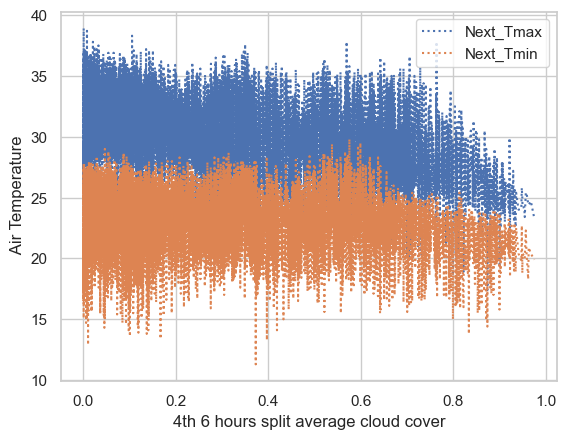

In [34]:
# Relation between Air Temperature and  4th 6hours split average cloud cover
x=df['LDAPS_CC4']
y1=df['Next_Tmax']
y2=df['Next_Tmin']
plt.xlabel("4th 6 hours split average cloud cover")
plt.ylabel(" Air Temperature")
sns.lineplot(x, y1,linestyle='dotted',label ='Next_Tmax')
sns.lineplot(x, y2,linestyle='dotted',label ='Next_Tmin')
plt.legend()

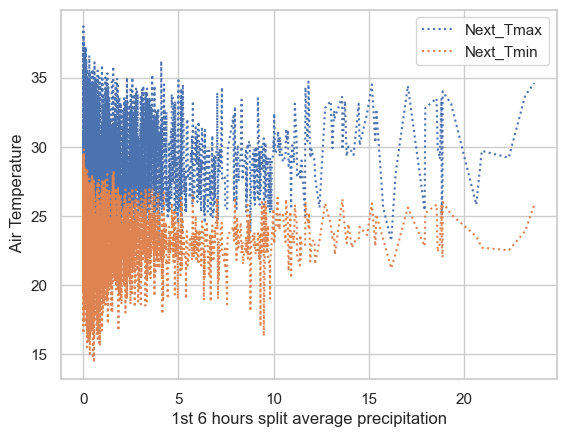

In [35]:
# Relation between Air Temperature and  1st 6hours split average precipitation
x=df['LDAPS_PPT1']
y1=df['Next_Tmax']
y2=df['Next_Tmin']
plt.xlabel("1st 6 hours split average precipitation")
plt.ylabel(" Air Temperature")
sns.lineplot(x, y1,linestyle='dotted',label ='Next_Tmax')
sns.lineplot(x, y2,linestyle='dotted',label ='Next_Tmin')
plt.legend()

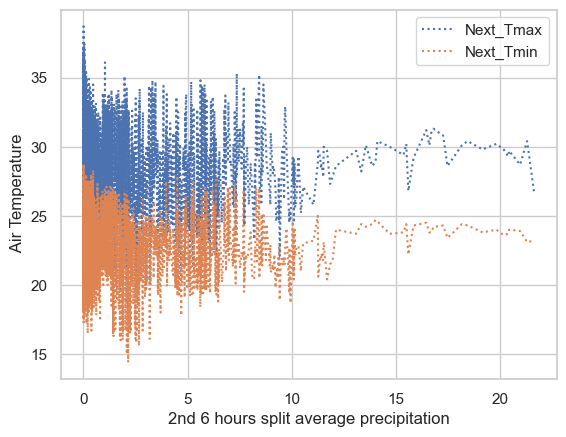

In [36]:
# Relation between Air Temperature and  2nd 6hours split average precipitation
x=df['LDAPS_PPT2']
y1=df['Next_Tmax']
y2=df['Next_Tmin']
plt.xlabel("2nd 6 hours split average precipitation")
plt.ylabel(" Air Temperature")
sns.lineplot(x, y1,linestyle='dotted',label ='Next_Tmax')
sns.lineplot(x, y2,linestyle='dotted',label ='Next_Tmin')
plt.legend()

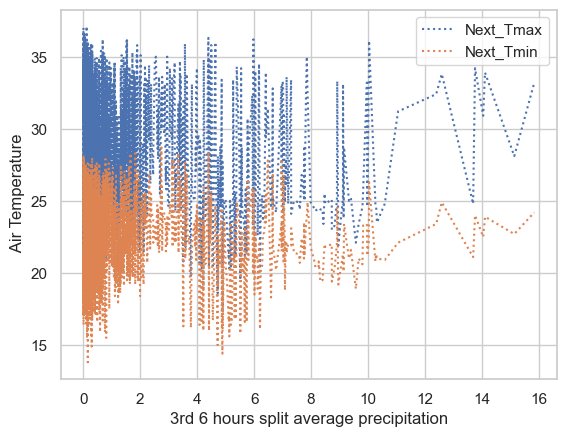

In [37]:
# Relation between Air Temperature and  3rd 6hours split average precipitation
x=df['LDAPS_PPT3']
y1=df['Next_Tmax']
y2=df['Next_Tmin']
plt.xlabel("3rd 6 hours split average precipitation")
plt.ylabel(" Air Temperature")
sns.lineplot(x, y1,linestyle='dotted',label ='Next_Tmax')
sns.lineplot(x, y2,linestyle='dotted',label ='Next_Tmin')
plt.legend()

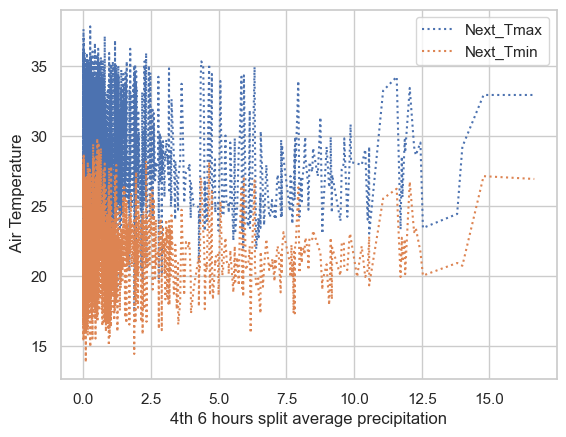

In [38]:
# Relation between Air Temperature and  4th 6hours split average precipitation
x=df['LDAPS_PPT4']
y1=df['Next_Tmax']
y2=df['Next_Tmin']
plt.xlabel("4th 6 hours split average precipitation")
plt.ylabel(" Air Temperature")
sns.lineplot(x, y1,linestyle='dotted',label ='Next_Tmax')
sns.lineplot(x, y2,linestyle='dotted',label ='Next_Tmin')
plt.legend()

In [39]:
# drop unuse columns
df=df.drop(['station','Date'],axis=1)

In [40]:
#Removing outliers
from scipy.stats import zscore

In [41]:
z=np.abs(zscore(df))
z

,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,0.353318,0.748029,0.104660,0.382768,0.525269,0.215525,0.126423,0.206603,0.513123,0.587938,...,0.275777,0.239969,0.224971,1.186076,0.005302,2.769091,1.111162,1.510565,0.366861,0.689265
1,0.725138,0.664721,0.305052,0.311697,0.078334,0.223368,0.644133,0.313359,0.545304,0.402304,...,0.275777,0.239969,0.224971,1.186076,0.512280,0.315828,0.543220,1.222997,0.083068,0.165513
2,0.624033,0.043400,0.549344,0.609425,0.160080,0.449896,0.439100,1.244497,0.606944,0.380211,...,0.275777,0.239969,0.224971,0.650626,0.840503,0.526719,0.723891,1.209602,0.275895,0.398527
3,0.758840,0.085054,0.103573,1.128335,0.028710,0.079238,0.663353,0.096026,0.580143,0.502221,...,0.275777,0.239969,0.224971,1.987268,0.386040,0.298272,0.928888,1.194265,0.468721,0.559681
4,0.556630,0.539758,0.037665,0.249244,0.171981,0.010803,0.624327,1.349989,0.827872,0.409191,...,0.275777,0.239969,0.224971,0.117159,1.812547,0.494848,0.549485,1.200286,0.308032,0.165513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,2.240616,2.247578,2.190405,1.402898,0.614083,2.223667,0.225479,1.569844,1.203497,1.261546,...,0.275777,0.239969,0.224971,0.117159,0.613271,0.655747,0.500966,2.065599,0.848928,2.099366
7746,2.442826,2.414195,1.820788,0.648815,0.990460,2.432415,0.609132,0.583486,1.151793,1.283455,...,0.275777,0.239969,0.224971,0.686016,1.193973,0.735482,0.820711,2.098689,0.720377,2.341098
7747,2.173212,2.539157,2.050081,1.318376,1.110333,2.021883,0.434188,0.283984,1.290699,1.064318,...,0.275777,0.239969,0.224971,0.150566,1.267697,0.852919,0.804538,2.095175,0.623964,1.938212
7748,2.173212,2.289232,2.234735,1.537141,0.886737,2.039881,0.253241,0.452772,1.268430,1.087864,...,0.275777,0.239969,0.224971,0.418291,1.040466,0.821476,0.755800,2.106671,0.527550,1.656192


In [42]:
threshold=3
print(np.where(z>3))

(array([  25,   25,   26, ..., 7581, 7582, 7582], dtype=int64), array([ 6, 13, 13, ...,  1,  1,  5], dtype=int64))


In [43]:
df1=df[(z<3).all(axis=1)]
df1

,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,23.1,17.8,24.688997,78.261383,27.812697,18.303014,6.603253,9.614074,0.052902,0.030169,...,0.0,0.0,0.0,37.5507,127.040,26.2980,0.5721,4456.024414,27.6,17.7
7746,22.5,17.4,30.094858,83.690018,26.704905,17.814038,5.768083,82.146707,0.066461,0.024518,...,0.0,0.0,0.0,37.5102,127.086,21.9668,0.1332,4441.803711,28.0,17.1
7747,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,0.081035,...,0.0,0.0,0.0,37.5372,126.891,15.5876,0.1554,4443.313965,28.3,18.1
7748,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,0.074962,...,0.0,0.0,0.0,37.5237,126.909,17.2956,0.2223,4438.373535,28.6,18.8


In [44]:
print("shape of old dataframe df :",df.shape)
print("shape of new data frame df_new :",df1.shape)

shape of old dataframe df : (7588, 23)
shape of new data frame df_new : (6739, 23)


In [45]:
print("Data Loss percentage :",((df.shape[0]-df1.shape[0])/df.shape[0])*100)

Data Loss percentage : 11.188719030047443


In [46]:
# split into x and y
x=df1.iloc[:,:-2]

In [47]:
x

,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,...,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996
1,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,...,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500
2,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,...,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664
3,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,...,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844
4,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,...,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,23.1,17.8,24.688997,78.261383,27.812697,18.303014,6.603253,9.614074,0.052902,0.030169,...,0.004380,0.0,0.0,0.0,0.0,37.5507,127.040,26.2980,0.5721,4456.024414
7746,22.5,17.4,30.094858,83.690018,26.704905,17.814038,5.768083,82.146707,0.066461,0.024518,...,0.017678,0.0,0.0,0.0,0.0,37.5102,127.086,21.9668,0.1332,4441.803711
7747,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,0.030034,0.081035,...,0.000000,0.0,0.0,0.0,0.0,37.5372,126.891,15.5876,0.1554,4443.313965
7748,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,0.035874,0.074962,...,0.000000,0.0,0.0,0.0,0.0,37.5237,126.909,17.2956,0.2223,4438.373535


we have 2 Target Variables

so y has 2 variables 

In [48]:
y=df1[['Next_Tmax','Next_Tmin']]

In [49]:
y

,Next_Tmax,Next_Tmin
0,29.1,21.2
1,30.5,22.5
2,31.1,23.9
3,31.7,24.3
4,31.2,22.5
...,...,...
7745,27.6,17.7
7746,28.0,17.1
7747,28.3,18.1
7748,28.6,18.8


In [50]:
# Feature Scaling
from sklearn.preprocessing import StandardScaler
st=StandardScaler()

In [51]:
x=st.fit_transform(x)
x

array([[-0.42570408, -0.81445954,  0.19591466, ...,  2.82873603,
         1.14315312,  1.54306808],
       [ 0.69021541, -0.72778535, -0.23660376, ..., -0.30440591,
        -0.53650916,  1.24950169],
       [ 0.58559796,  0.00894523, -0.49449394, ..., -0.5185938 ,
        -0.71994139,  1.23582661],
       ...,
       [-2.30881822, -2.67795455, -2.07876629, ..., -0.8498936 ,
        -0.80182021, -2.13788629],
       [-2.30881822, -2.41793199, -2.27369879, ..., -0.81795874,
        -0.75233789, -2.14962204],
       [-2.3436907 , -2.54794327, -2.35364587, ..., -0.77516454,
        -0.71609523, -2.11880846]])

In [52]:
from sklearn.decomposition import PCA


In [53]:
pca=PCA(n_components=20)
x=pca.fit_transform(x)
x

array([[-0.05417383,  2.42159408, -2.26448033, ...,  1.01462653,
        -0.24101937,  0.11208326],
       [-0.95112285,  0.15353596, -0.24521156, ...,  0.11365356,
        -0.39046377,  0.12016103],
       [-1.19582487, -0.67315907,  0.43804702, ...,  0.3146576 ,
        -0.2115782 ,  0.1195385 ],
       ...,
       [-2.23145105,  3.99968751,  3.39513922, ..., -0.40906053,
         0.42475073,  0.17552355],
       [-2.36837325,  3.73542065,  3.59799918, ..., -0.2961929 ,
         0.44472056,  0.15065779],
       [-2.36075025,  3.69528716,  3.80330097, ..., -0.28891817,
         0.29694489,  0.06004142]])

In [54]:
x.shape

(6739, 20)

In [55]:
# splitting data into train and test
from sklearn.model_selection import train_test_split

In [56]:

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=42)


In [57]:
print(x_train.shape),print(x_test.shape),print(y_train.shape),print(y_test.shape)


(5391, 20)
(1348, 20)
(5391, 2)
(1348, 2)


(None, None, None, None)

# import models

In [58]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.model_selection import cross_val_score

In [59]:
lr=LinearRegression()
lr.fit(x_train,y_train)
predlr=lr.predict(x_test)
pred_trainlr=lr.predict(x_train)
print("r2_score:", r2_score(y_test,predlr))
print("r2_score on training data:", r2_score(y_train,pred_trainlr))
print("Mean Squared Error:", mean_squared_error(y_test,predlr))
print("Mean Absolute Error:", mean_absolute_error(y_test,predlr))
print("root mean squared erroe:", np.sqrt(mean_squared_error(y_test,predlr)))
print("Mape:", mean_absolute_percentage_error(y_test,predlr))

r2_score: 0.7791992233498459
r2_score on training data: 0.7885458638592211
Mean Squared Error: 1.6139168890871827
Mean Absolute Error: 0.9672037027395507
root mean squared erroe: 1.270400286951787
Mape: 0.03664270218485995


Text(0, 0.5, 'predicted value')

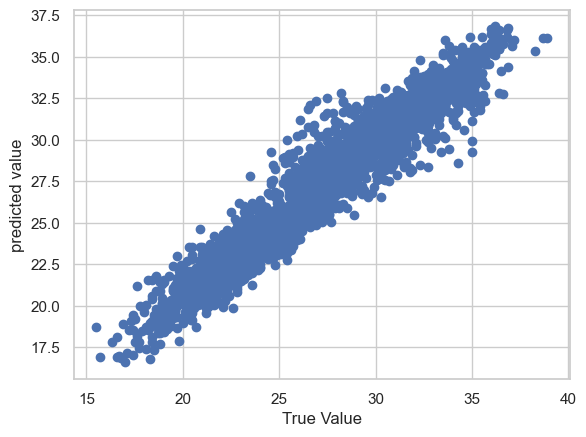

In [60]:
plt.scatter(y_test,predlr)
plt.xlabel("True Value")
plt.ylabel("predicted value")

In [61]:
dtr=DecisionTreeRegressor(random_state=0,max_depth=4)
dtr.fit(x_train,y_train)
preddtr=dtr.predict(x_test)
pred_traindtr=dtr.predict(x_train)
print("r2_score:", r2_score(y_test,preddtr))
print("r2_score on training data:", r2_score(y_train,pred_traindtr))
print("Mean Squared Error:", mean_squared_error(y_test,preddtr))
print("Mean Absolute Error:", mean_absolute_error(y_test,preddtr))
print("root mean squared erroe:", np.sqrt(mean_squared_error(y_test,preddtr)))
print("Mape:", mean_absolute_percentage_error(y_test,preddtr))

r2_score: 0.6259524599037989
r2_score on training data: 0.6440435980237007
Mean Squared Error: 2.727741425706623
Mean Absolute Error: 1.2791306591999951
root mean squared erroe: 1.6515875470911685
Mape: 0.04851801854712963


Text(0, 0.5, 'predicted value')

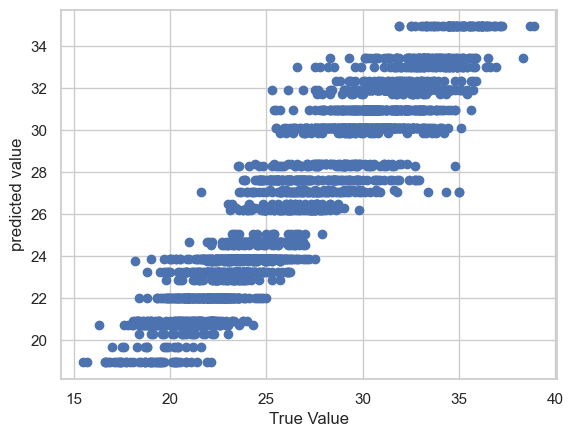

In [62]:
plt.scatter(y_test,preddtr)
plt.xlabel("True Value")
plt.ylabel("predicted value")

In [63]:
knn=KNeighborsRegressor()
knn.fit(x_train,y_train)
predknn=knn.predict(x_test)
pred_trainknn=knn.predict(x_train)
print("r2_score:", r2_score(y_test,predknn))
print("r2_score on training data:", r2_score(y_train,pred_trainknn))
print("Mean Squared Error:", mean_squared_error(y_test,predknn))
print("Mean Absolute Error:", mean_absolute_error(y_test,predknn))
print("root mean squared erroe:", np.sqrt(mean_squared_error(y_test,preddtr)))
print("Mape:", mean_absolute_percentage_error(y_test,predknn))

r2_score: 0.8607053717115357
r2_score on training data: 0.9099941056843676
Mean Squared Error: 1.006518991097923
Mean Absolute Error: 0.741691394658754
root mean squared erroe: 1.6515875470911685
Mape: 0.028178426232821144


Text(0, 0.5, 'predicted value')

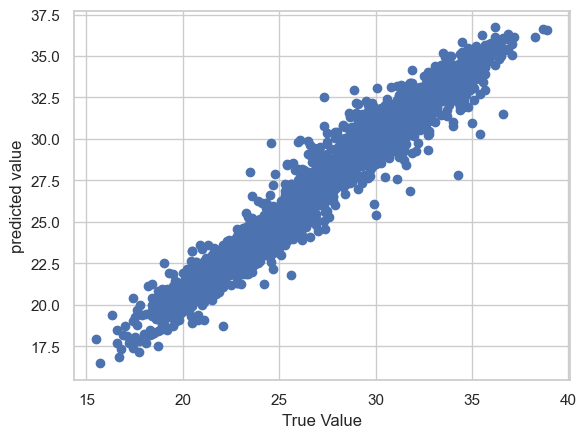

In [64]:
plt.scatter(y_test,predknn)
plt.xlabel("True Value")
plt.ylabel("predicted value")

In [65]:
rf=RandomForestRegressor(random_state=0,max_depth=4,min_samples_split=2,min_samples_leaf=2)
rf.fit(x_train,y_train)
predrf=rf.predict(x_test)
pred_trainrf=rf.predict(x_train)
print("r2_score:", r2_score(y_test,predrf))
print("r2_score on training data:", r2_score(y_train,pred_trainrf))
print("Mean Squared Error:", mean_squared_error(y_test,predrf))
print("Mean Absolute Error:", mean_absolute_error(y_test,predrf))
print("root mean squared erroe:", np.sqrt(mean_squared_error(y_test,predrf)))
print("Mape:", mean_absolute_percentage_error(y_test,predrf))

r2_score: 0.6774907324320494
r2_score on training data: 0.6979612620175353
Mean Squared Error: 2.343922810277362
Mean Absolute Error: 1.1812608194915932
root mean squared erroe: 1.5309875277994143
Mape: 0.04482447972883527


Text(0, 0.5, 'predicted value')

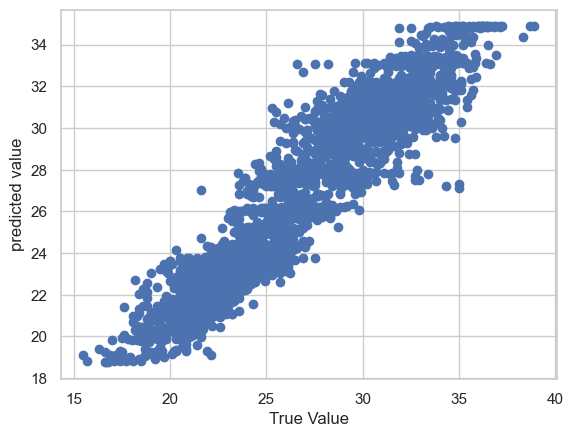

In [66]:
plt.scatter(y_test,predrf)
plt.xlabel("True Value")
plt.ylabel("predicted value")

In [67]:
from sklearn.metrics import mean_absolute_percentage_error
rd=Ridge(alpha=0.01)
rd.fit(x_train,y_train)
predrd=rd.predict(x_test)
pred_trainrd=rd.predict(x_train)
print("r2_score:", r2_score(y_test,predrd))
print("r2_score on training data:", r2_score(y_train,pred_trainrd))
print("Mean Squared Error:", mean_squared_error(y_test,predrd))
print("Mean Absolute Error:", mean_absolute_error(y_test,predrd))
print("root mean squared error:", np.sqrt(mean_squared_error(y_test,predrd)))
print("Mape:", mean_absolute_percentage_error(y_test,predrd))

r2_score: 0.7791992263060512
r2_score on training data: 0.7885458638571365
Mean Squared Error: 1.613916784104067
Mean Absolute Error: 0.9672036729646346
root mean squared error: 1.2704002456328742
Mape: 0.03664270172515198


# compare all score

In [68]:
models={"Models":['Linear Regression','Decision Tree','KNeighbors','RandomForest','Ridge'],"Score":[r2_score(y_test,predlr),r2_score(y_test,preddtr),
         r2_score(y_test,predknn),r2_score(y_test,predrf),r2_score(y_test,predrd)],"MSE":[mean_squared_error(y_test,predlr),mean_squared_error(y_test,preddtr),
        mean_squared_error(y_test,predknn),mean_squared_error(y_test,predrf),mean_squared_error(y_test,predrd)],"MAE":[mean_absolute_error(y_test,predlr),mean_absolute_error(y_test,preddtr),
        mean_absolute_error(y_test,predknn),mean_absolute_error(y_test,predrf),mean_absolute_error(y_test,predrd)],'RSME':[np.sqrt(mean_squared_error(y_test,predlr)),np.sqrt(mean_squared_error(y_test,preddtr)),
         np.sqrt(mean_squared_error(y_test,predknn)),np.sqrt(mean_squared_error(y_test,predrf)),np.sqrt(mean_squared_error(y_test,predrd))],"MAPE":[mean_absolute_percentage_error(y_test,predlr),mean_absolute_percentage_error(y_test,preddtr),
        mean_absolute_percentage_error(y_test,predknn),mean_absolute_percentage_error(y_test,predrf),mean_absolute_percentage_error(y_test,predrd)]}

In [69]:
df2=pd.DataFrame(models)
df2

,Models,Score,MSE,MAE,RSME,MAPE
0,Linear Regression,0.779199,1.613917,0.967204,1.270400,0.036643
1,Decision Tree,0.625952,2.727741,1.279131,1.651588,0.048518
2,KNeighbors,0.860705,1.006519,0.741691,1.003254,0.028178
3,RandomForest,0.677491,2.343923,1.181261,1.530988,0.044824
4,Ridge,0.779199,1.613917,0.967204,1.270400,0.036643


1. Among all above models Knn performs well as compare to all other
2. with high r2_score with least mean absolute percentage error


# Apply Validation with best model

In [70]:
score2=cross_val_score(knn,x,y,cv=5)
print(score2)
print(score2.mean())
print(score2.std())

[0.55449755 0.46874472 0.58546514 0.63472675 0.6666249 ]
0.5820118135001302
0.06860996258580165


In [71]:
from sklearn.model_selection import KFold

In [72]:
kf=KFold(n_splits=5)
kf.get_n_splits(x)
print(kf)

KFold(n_splits=5, random_state=None, shuffle=False)


# Save best model

In [73]:
import pickle
filename="KNeighborsRegressor.pkl"
pickle.dump(knn,open(filename,'wb'))

load_model=pickle.load(open(filename,'rb'))
load_model.predict(x_test)

array([[30.02, 22.82],
       [28.78, 21.18],
       [32.56, 26.44],
       ...,
       [33.36, 24.62],
       [33.86, 25.08],
       [28.42, 24.48]])

In [74]:
# checking prediction
def predval(p):
    p=p.reshape(1,-1)
    print(p.shape)
    predvalue=knn.predict(p)
    print(predvalue)

In [75]:
p=np.array([28.7,21.4,58.25568771,91.11636353,28.07410146,23.00693617,6.818886966,69.45180527,0.233947471,0.20389571,0.161696854,0.130928198,0,0,0,0,37.6046,126.991,212.335,2.785])
predval(p)

(1, 20)
[[26.58 17.82]]
